In [503]:
function threshold_function(_step, γ)
    return function is_in_threshold(a, b)
        return abs(a - b) <= (_step/(1 - γ))
    end
end

function gittins(γ, N, _step=0.0001)
    G  = zeros(N-1, N-1); #intermediate values
    Gittins = zeros(N-1, N-1); #final indices
    ϵ_ball = threshold_function(_step, γ)
    for i in 1:N-1
        G[i, N-i] = i/N
    end
    for λ in (_step/2):_step:1
        retire_to_safe = λ/(1 - γ)
        for total in (N-1):-1:2
            for α in 1:(total-1)
                β = total - α
                pull_risky = (α/total)*(1 + γ*G[α+1, β]) + (β/total)*γ*G[α, β+1];
                if (Gittins[α, β] == 0) && ϵ_ball(retire_to_safe, pull_risky)
                    Gittins[α, β] = λ - (_step/2)
                end
                G[α, β] = max(retire_to_safe, pull_risky)
            end
        end
    end
    return Gittins
end

gittins (generic function with 2 methods)

In [477]:
G = gittins(0.9, 1200);

In [532]:
validity_threshod = 0.025
mean_values = validity_threshod:validity_threshod:1-validity_threshod
possible_numbers = 1:400
is_int(x) = floor(x) == x
acceptable_ns = [findall(is_int.(mean_value*possible_numbers)) for mean_value in mean_values]
function_values = [[1/(G[round(Int,n*mean_value), n - round(Int, n*mean_value)] - mean_value) for n in ns] 
                   for (mean_value,ns) in zip(mean_values, acceptable_ns)];

In [547]:
include("utils/manipulation.jl")
using ScikitLearn, DataFrames
@sk_import linear_model: LinearRegression
dfs = [DataFrame(hcat([[1, n, n^(-1), f, f^(-2)] 
                      for (n, f) in zip(ns,values)]...)',
                    [:c, :x, :inv_x, :y, :w]) for (ns, values) in zip(acceptable_ns, function_values)];
reg = LinearRegression(fit_intercept=false);
coefs = [ScikitLearn.fit!(reg, value(df[[:c,:x, :inv_x]]), df[:y], sample_weight=df[:w])[:coef_]
        for df in dfs];

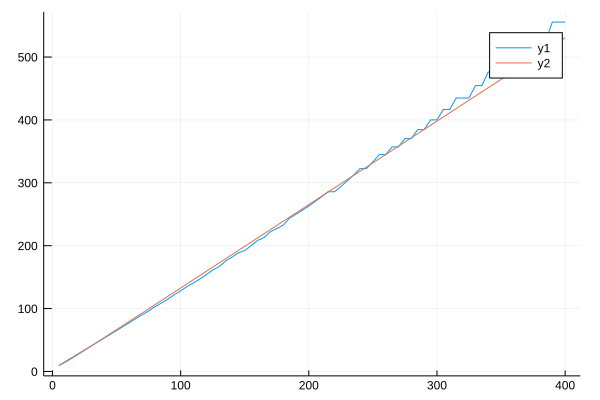

In [548]:
using DataFrames
index = 24
λ_aprox = λ_aprox_factory(index, coefs)
aprox = [λ_aprox(n) for n in acceptable_ns[index]]
plot(acceptable_ns[index], [function_values[index], aprox])

In [552]:
using JLD
save("gittins/gittins.jld", "coefs", coefs, "mean_values", mean_values, "G_400_1200_09", G[1:400, 1:400])

In [1]:
using JLD

file = load("gittins/gittins.jld")
coefs = file["coefs"];
mean_values = file["mean_values"];
G = file["G_400_1200_09"];

function get_closest_indices(vector, value)
    diffs = vector .- value
    index1 = findall(x -> x==min(abs.(diffs)...), abs.(diffs))[1]
    if value < vector[index1]
        return max(index1 - 1, 1), index1
    end
    return index1, min(index1 + 1, length(vector))
end

function λ_aprox_factory(i, coefs, λ_values)
    coefs_ = coefs[i]
    λ = λ_values[i]
    return function λ_aprox(n)
        y = coefs_[1] + coefs_[2]*n + (coefs_[3]/n)
        return (1/y) + λ
    end
end

function gittins_aprox_factory(coefs, mean_values)
    λ_values = collect(mean_values)
    return function gittins_aprox(α, β)
        total = α + β
        λ = α / total
        i1, i2 = get_closest_indices(λ_values, λ)
        λ1, λ2 = λ_values[i1], λ_values[i2]
        g1, g2 = λ_aprox_factory(i1, coefs, λ_values)(total), λ_aprox_factory(i2, coefs, λ_values)(total)
        return g1 + ((λ - λ1)/(λ2 - λ1))*(g2 - g1)
    end
end

gittins_aprox = gittins_aprox_factory(coefs, mean_values)

function gittins_index(α, β)
    total = α + β
    if total <= 400
        return G[α, β]
    end
    return gittins_aprox(α, β)
end

gittins_index (generic function with 1 method)

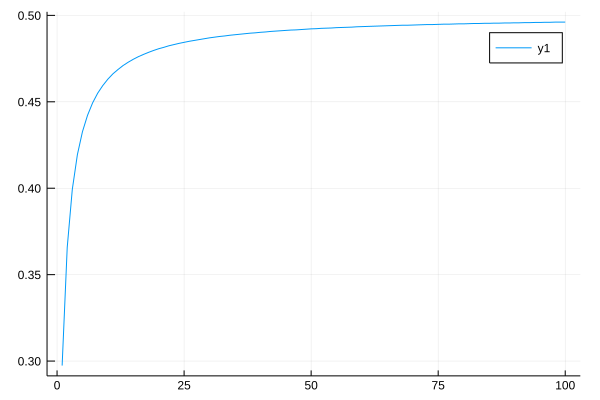

In [6]:
using Plots
as = [i for i in 1:100]
bs = [i for i in 1:100]
plot([2*(a/(a+b)) - gittins_index(a, b) for (a, b) in zip(as, bs)])

In [3]:
index = 100;
#plot(1:index , 1:index, G[1:index, 1:index], st=:surface)

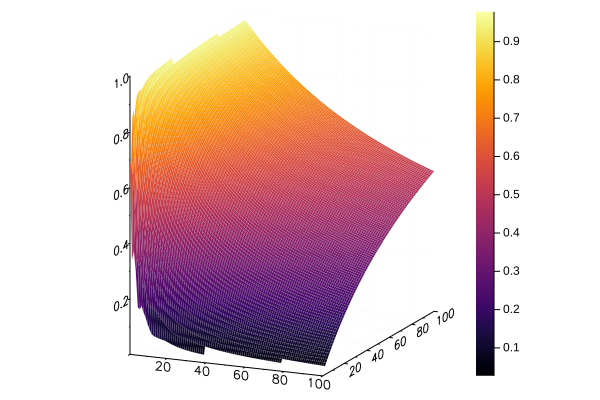

In [4]:
index = 100
G_approx = zeros(index, index)
for i in 1:index
    for j in 1:index
        G_approx[i,j] = gittins_aprox(i, j)
    end
end
plot(1:index , 1:index, G_approx[1:index, 1:index], st=:surface)

In [567]:
index=600
G_final = zeros(index, index)
for i in 1:index
    for j in 1:index
        G_final[i,j] = gittins_index(i, j)
    end
end
#plot(1:index , 1:index, G_final[1:index, 1:index], st=:surface)

In [573]:
include("gittins/gittins.jl");

In [574]:
index=200
G_final = zeros(index, index)
for i in 1:index
    for j in 1:index
        G_final[i,j] = gittins_index(i, j)
    end
end
plot(1:index , 1:index, G_final[1:index, 1:index], st=:surface)